Image size: 52601100
Array shape: (100, 647, 813)


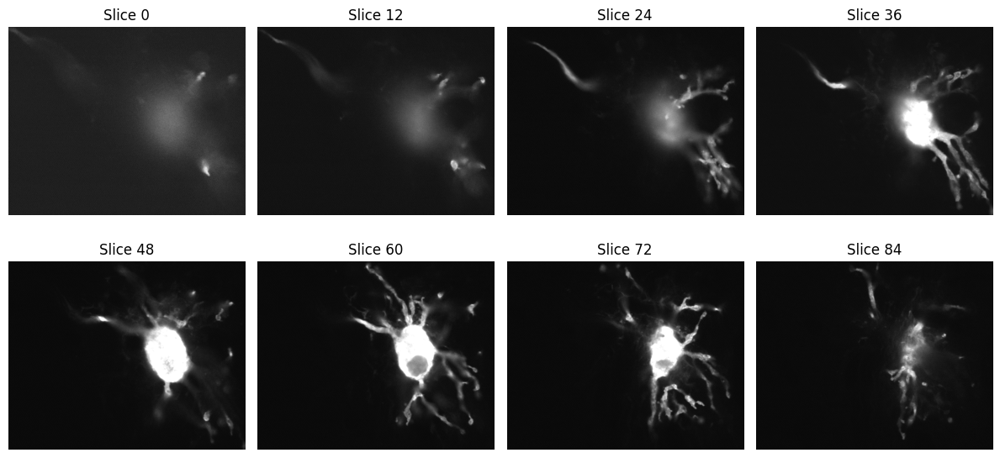

In [15]:
# read tiif image
import tifffile as tiff
import numpy as np

# Read the TIF image
img = tiff.imread('10-2900-control-cell-05.oif-C0.v3dpbd.tif')

# crop the image to a smaller size X=[0-812], Y=[206-852], Z=[9-108]
img = img[9:109, 206:853, 0:813]

# Convert to numpy array if needed
img_array = np.array(img)

# Display basic info
print(f"Image size: {img.size}")
print(f"Array shape: {img_array.shape}")

# Optionally, display the image using matplotlib slice_idx = range(0, 100, 100//8) = range(0, 100, 12) = [0, 12, 24, 36, 48, 60, 72, 84]
import matplotlib.pyplot as plt
slice_idx = range(0, img_array.shape[0], img_array.shape[0] // 8)
fig, axes = plt.subplots(2, 4, figsize=(12, 6))
for ax, idx in zip(axes.flatten(), slice_idx):
    ax.imshow(img_array[idx, :, :], cmap='gray')
    ax.set_title(f'Slice {idx}')
    ax.axis('off')
plt.tight_layout()
plt.show()


Loaded 1034 nodes from SWC file
Position range: X=[0.0, 812.1], Y=[206.0, 852.3], Z=[9.0, 107.6]
Radius range: [0.069, 2.449]


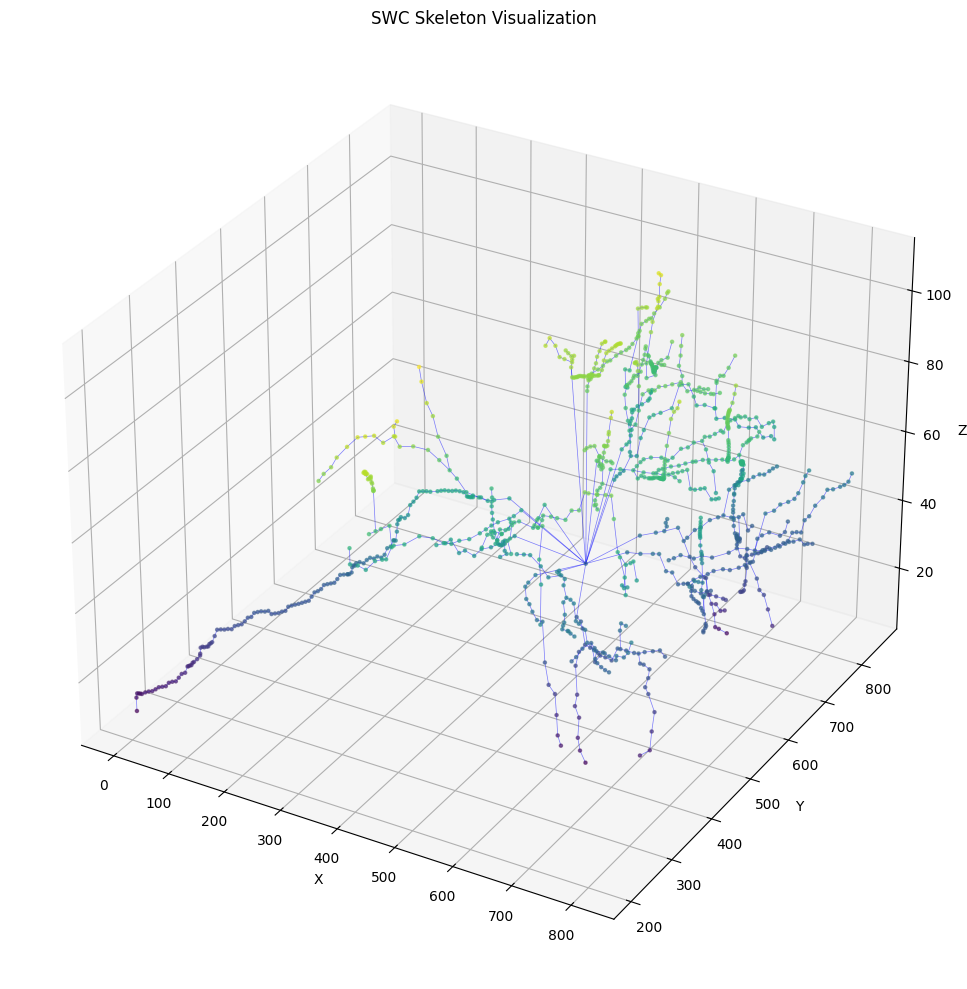

In [32]:
# visualise the skeleton swc file with their connections
# read the swc file
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Parse SWC file
swc_path = '10-2900-control-cell-05.oif-C0.v3dpbd.swc'
nodes = []
with open(swc_path, 'r') as f:
    for line in f:
        line = line.strip()
        if not line or line.startswith('#'):
            continue
        parts = line.split()
        if len(parts) >= 7:
            node = {
                'id': int(parts[0]),
                'type': int(parts[1]),
                'x': float(parts[2]),
                'y': float(parts[3]),
                'z': float(parts[4]),
                'radius': float(parts[5]),
                'parent': int(parts[6])
            }
            nodes.append(node)

print(f"Loaded {len(nodes)} nodes from SWC file")

# Extract positions and connections
positions = np.array([[n['x'], n['y'], n['z']] for n in nodes])
radii = np.array([n['radius'] for n in nodes])

print(f"Position range: X=[{positions[:,0].min():.1f}, {positions[:,0].max():.1f}], "
      f"Y=[{positions[:,1].min():.1f}, {positions[:,1].max():.1f}], "
      f"Z=[{positions[:,2].min():.1f}, {positions[:,2].max():.1f}]")
print(f"Radius range: [{radii.min():.3f}, {radii.max():.3f}]")

# Create 3D visualization
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')

# Plot skeleton points
ax.scatter(positions[:,0], positions[:,1], positions[:,2], 
           c=positions[:,2], cmap='viridis', s=5, alpha=0.6)

# Draw connections (edges between parent-child nodes)
id_to_idx = {n['id']: i for i, n in enumerate(nodes)}
for node in nodes:
    if node['parent'] > 0 and node['parent'] in id_to_idx:
        parent_idx = id_to_idx[node['parent']]
        child_idx = id_to_idx[node['id']]
        ax.plot([positions[parent_idx, 0], positions[child_idx, 0]],
                [positions[parent_idx, 1], positions[child_idx, 1]],
                [positions[parent_idx, 2], positions[child_idx, 2]],
                'b-', linewidth=0.5, alpha=0.5)

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('SWC Skeleton Visualization')
plt.tight_layout()
plt.show()

In [12]:
# Create proper cylinder mesh with circular cross-sections

%pip install numpy-stl

import numpy as np
from stl import mesh

def create_cylinder(start, end, radius, segments=16):
    """Create a properly oriented cylinder mesh with circular cross-section."""
    # Direction vector
    v = end - start
    height = np.linalg.norm(v)
    if height < 1e-8:
        return None, None
    v_norm = v / height  # Normalized direction
    
    # Find two perpendicular vectors using Gram-Schmidt
    if abs(v_norm[0]) < 0.9:
        perp1 = np.array([1, 0, 0])
    else:
        perp1 = np.array([0, 1, 0])
    
    perp1 = perp1 - np.dot(perp1, v_norm) * v_norm
    perp1 = perp1 / np.linalg.norm(perp1)
    perp2 = np.cross(v_norm, perp1)
    
    # Create circle points perpendicular to the cylinder axis
    theta = np.linspace(0, 2 * np.pi, segments, endpoint=False)
    
    # Create vertices for bottom and top circles
    vertices = []
    for t in theta:
        circle_point = radius * (np.cos(t) * perp1 + np.sin(t) * perp2)
        vertices.append(start + circle_point)  # Bottom
        vertices.append(end + circle_point)    # Top
    
    # Add center points for end caps
    bottom_center_idx = len(vertices)
    vertices.append(start)
    top_center_idx = len(vertices)
    vertices.append(end)
    
    vertices = np.array(vertices)
    
    # Create faces
    faces = []
    for i in range(segments):
        next_i = (i + 1) % segments
        # Side faces (2 triangles per quad)
        faces.append([i * 2, next_i * 2, i * 2 + 1])
        faces.append([next_i * 2, next_i * 2 + 1, i * 2 + 1])
        # Bottom cap
        faces.append([bottom_center_idx, next_i * 2, i * 2])
        # Top cap
        faces.append([top_center_idx, i * 2 + 1, next_i * 2 + 1])
    
    return vertices, faces

# Load SWC nodes
swc_path = '10-2900-control-cell-05.oif-C0.v3dpbd.swc'
nodes = []
with open(swc_path, 'r') as f:
    for line in f:
        line = line.strip()
        if not line or line.startswith('#'):
            continue
        parts = line.split()
        if len(parts) >= 7:
            node = {
                'id': int(parts[0]),
                'type': int(parts[1]),
                'x': float(parts[2]),
                'y': float(parts[3]),
                'z': float(parts[4]),
                'radius': float(parts[5]),
                'parent': int(parts[6])
            }
            nodes.append(node)
print(f"Loaded {len(nodes)} nodes from SWC file")

# Create mesh for cylinders with higher resolution
all_vertices = []
all_faces = []
vertex_offset = 0
id_to_idx = {n['id']: i for i, n in enumerate(nodes)}
radius_scale = 2.0  # Scale up radii for visibility

for node in nodes:
    if node['parent'] > 0 and node['parent'] in id_to_idx:
        parent_idx = id_to_idx[node['parent']]
        child_idx = id_to_idx[node['id']]
        start = np.array([nodes[parent_idx]['x'], nodes[parent_idx]['y'], nodes[parent_idx]['z']])
        end = np.array([nodes[child_idx]['x'], nodes[child_idx]['y'], nodes[child_idx]['z']])
        radius = (nodes[parent_idx]['radius'] + nodes[child_idx]['radius']) / 2.0 * radius_scale
        
        # Use 16 segments for smoother cylinders
        result = create_cylinder(start, end, radius, segments=16)
        if result[0] is not None:
            vertices, faces = result
            all_vertices.append(vertices)
            all_faces.append(np.array(faces) + vertex_offset)
            vertex_offset += vertices.shape[0]

# Combine all vertices and faces
all_vertices = np.vstack(all_vertices)
all_faces = np.vstack(all_faces)

# Create STL mesh
skeleton_mesh = mesh.Mesh(np.zeros(all_faces.shape[0], dtype=mesh.Mesh.dtype))
for i, f in enumerate(all_faces):
    for j in range(3):
        skeleton_mesh.vectors[i][j] = all_vertices[f[j], :]

# Save to STL file
skeleton_mesh.save('skeleton_reconstruction.stl')
print(f"Saved skeleton reconstruction to skeleton_reconstruction.stl")
print(f"Total vertices: {len(all_vertices)}, Total faces: {len(all_faces)}")

Note: you may need to restart the kernel to use updated packages.
Loaded 1034 nodes from SWC file
Saved skeleton reconstruction to skeleton_reconstruction.stl
Total vertices: 35122, Total faces: 66112


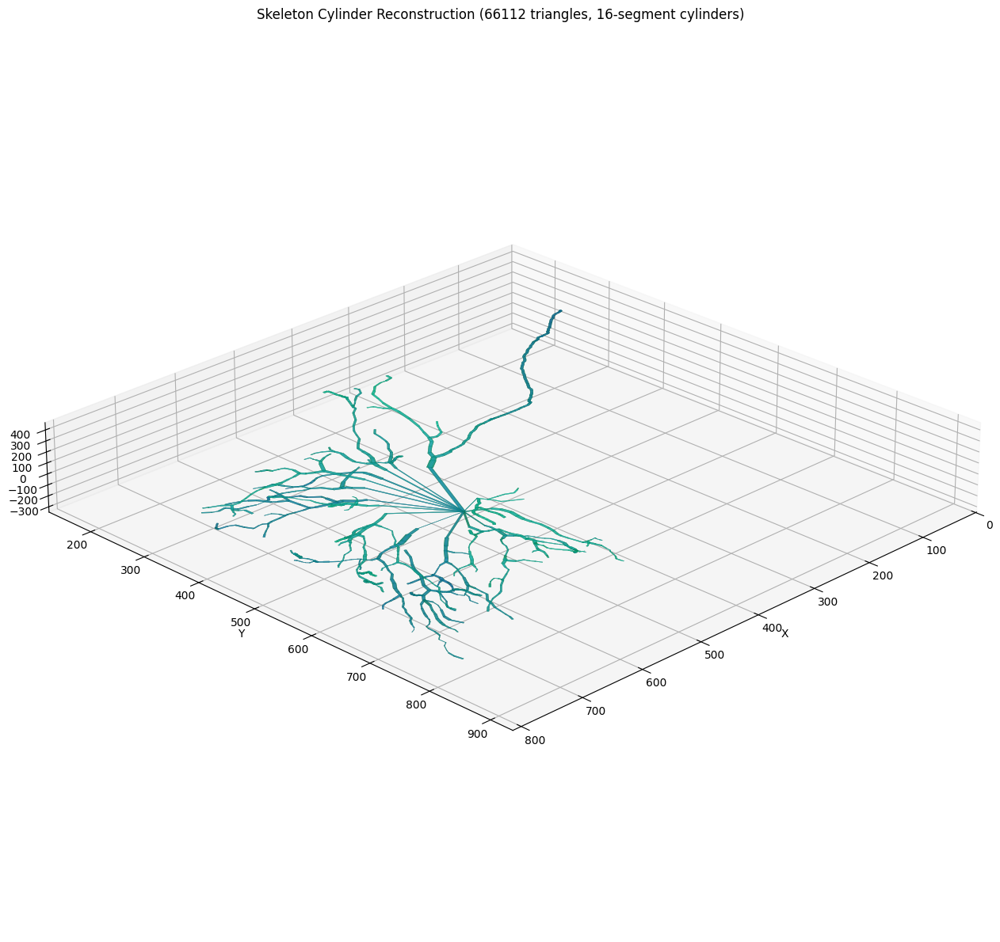

Mesh bounds: X=[-2.0, 813.5], Y=[204.0, 852.5], Z=[8.9, 108.4]


In [13]:
# Visualize the cylinder mesh with proper shading
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from stl import mesh
import matplotlib.colors as mcolors

# Read the stl file
stl_path = 'skeleton_reconstruction.stl'
skeleton_mesh = mesh.Mesh.from_file(stl_path)

# Create figure with proper lighting
fig = plt.figure(figsize=(16, 12))
ax = fig.add_subplot(111, projection='3d')

# Calculate normals for shading
normals = skeleton_mesh.normals
# Normalize the normals
norm_mags = np.linalg.norm(normals, axis=1, keepdims=True)
norm_mags[norm_mags == 0] = 1
normals_normalized = normals / norm_mags

# Light direction (from top-right)
light_dir = np.array([0.5, 0.5, 1.0])
light_dir = light_dir / np.linalg.norm(light_dir)

# Calculate shading based on normal-light angle
shade = np.abs(np.dot(normals_normalized, light_dir))
shade = 0.3 + 0.7 * shade  # Ambient + diffuse

# Create colors based on Z position and shading
z_vals = skeleton_mesh.vectors[:, :, 2].mean(axis=1)
z_min, z_max = z_vals.min(), z_vals.max()
z_norm = (z_vals - z_min) / (z_max - z_min + 1e-8)

# Create color array (blue to cyan gradient with shading)
colors = np.zeros((len(skeleton_mesh.vectors), 4))
colors[:, 0] = 0.1 * shade  # R
colors[:, 1] = 0.4 + 0.4 * z_norm * shade  # G
colors[:, 2] = 0.7 * shade  # B
colors[:, 3] = 0.9  # Alpha

# Plot with per-face colors
mesh_collection = Poly3DCollection(skeleton_mesh.vectors, facecolors=colors, edgecolors='none')
ax.add_collection3d(mesh_collection)

# Set axis limits
x_min, x_max = skeleton_mesh.x.min(), skeleton_mesh.x.max()
y_min, y_max = skeleton_mesh.y.min(), skeleton_mesh.y.max()
z_min, z_max = skeleton_mesh.z.min(), skeleton_mesh.z.max()

# Make axes equal scale
max_range = max(x_max - x_min, y_max - y_min, z_max - z_min) / 2
mid_x = (x_max + x_min) / 2
mid_y = (y_max + y_min) / 2
mid_z = (z_max + z_min) / 2

ax.set_xlim(mid_x - max_range, mid_x + max_range)
ax.set_ylim(mid_y - max_range, mid_y + max_range)
ax.set_zlim(mid_z - max_range, mid_z + max_range)

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title(f'Skeleton Cylinder Reconstruction ({len(skeleton_mesh.vectors)} triangles, 16-segment cylinders)')

# Better viewing angle
ax.view_init(elev=25, azim=45)
ax.set_box_aspect([1, 1, 0.15])  # Adjust for actual data aspect ratio

plt.tight_layout()
plt.show()

print(f"Mesh bounds: X=[{x_min:.1f}, {x_max:.1f}], Y=[{y_min:.1f}, {y_max:.1f}], Z=[{z_min:.1f}, {z_max:.1f}]")

In [14]:
# Interactive 3D visualization with Plotly
%pip install plotly

import plotly.graph_objects as go
import numpy as np
from stl import mesh

# Load the STL mesh
stl_path = 'skeleton_reconstruction.stl'
skeleton_mesh = mesh.Mesh.from_file(stl_path)

# Extract vertices and faces for plotly
vertices = skeleton_mesh.vectors.reshape(-1, 3)
# Create face indices (every 3 consecutive vertices form a triangle)
n_faces = len(skeleton_mesh.vectors)
i_indices = np.arange(0, n_faces * 3, 3)
j_indices = np.arange(1, n_faces * 3, 3)
k_indices = np.arange(2, n_faces * 3, 3)

# Color by Z position
z_vals = skeleton_mesh.vectors[:, :, 2].mean(axis=1)
z_min, z_max = z_vals.min(), z_vals.max()
intensity = (z_vals - z_min) / (z_max - z_min + 1e-8)

# Create the 3D mesh figure
fig = go.Figure(data=[
    go.Mesh3d(
        x=vertices[:, 0],
        y=vertices[:, 1],
        z=vertices[:, 2],
        i=i_indices,
        j=j_indices,
        k=k_indices,
        intensity=np.repeat(intensity, 3),  # One intensity per vertex
        colorscale='Viridis',
        opacity=0.9,
        lighting=dict(
            ambient=0.4,
            diffuse=0.8,
            specular=0.3,
            roughness=0.5,
            fresnel=0.2
        ),
        lightposition=dict(x=500, y=500, z=200),
        showscale=True,
        colorbar=dict(title='Z Height')
    )
])

# Update layout for better interaction
fig.update_layout(
    title='Interactive 3D Skeleton Cylinder Mesh',
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z',
        aspectmode='data',
        camera=dict(
            eye=dict(x=1.5, y=1.5, z=0.8)
        )
    ),
    width=900,
    height=700,
    margin=dict(l=0, r=0, t=40, b=0)
)

fig.show()
print(f"Mesh: {n_faces} triangles, {len(vertices)} vertices")

Note: you may need to restart the kernel to use updated packages.


Mesh: 66112 triangles, 198336 vertices


In [18]:
# Real-time 3DGS surface rendering with PyVista
%pip install "pyvista[jupyter]" trame trame-vtk trame-vuetify

import pyvista as pv
import numpy as np
import torch
from stl import mesh
import sys
sys.path.insert(0, '/home/armin/Documents/3DGR-CT')

# Load trained 3DGS model
checkpoint_path = 'outputs/gaussian_swc/tiff/checkpoints/model_iter_15000.pth'
checkpoint = torch.load(checkpoint_path, map_location='cpu')

# Extract Gaussian parameters
xyz = checkpoint['xyz'].numpy()
scales = torch.exp(checkpoint['scaling']).numpy()
rotations = checkpoint['rotation'].numpy()
intensities = checkpoint['intensity'].numpy() if 'intensity' in checkpoint else np.ones((xyz.shape[0], 1))

print(f"Loaded {xyz.shape[0]} Gaussians from trained model")
print(f"  Position range: [{xyz.min():.3f}, {xyz.max():.3f}]")
print(f"  Scale range: [{scales.min():.4f}, {scales.max():.4f}]")

# Load the skeleton cylinder mesh
stl_path = 'skeleton_reconstruction.stl'
skeleton_mesh = mesh.Mesh.from_file(stl_path)

# Convert STL to PyVista mesh
vertices = skeleton_mesh.vectors.reshape(-1, 3)
n_faces = len(skeleton_mesh.vectors)
faces = np.hstack([np.full((n_faces, 1), 3), 
                   np.arange(n_faces * 3).reshape(-1, 3)]).flatten()

# Create PyVista mesh
pv_mesh = pv.PolyData(vertices, faces)

# Compute normals for better lighting
pv_mesh.compute_normals(inplace=True)

# Color by Z height
z_vals = pv_mesh.points[:, 2]
pv_mesh['Z_Height'] = z_vals

print(f"Mesh: {pv_mesh.n_points} vertices, {pv_mesh.n_cells} cells")

# Denormalize Gaussian positions to match skeleton coordinates
vol_min = np.array([0.0, 206.0, 9.0])
vol_max = np.array([812.1, 852.3, 107.6])
vol_extent = vol_max - vol_min

# The Gaussians are stored in (D,H,W) = (Z,Y,X) order
margin = 0.05
gauss_x = (xyz[:, 2] - margin) / (1 - 2*margin) * vol_extent[0] + vol_min[0]
gauss_y = (xyz[:, 1] - margin) / (1 - 2*margin) * vol_extent[1] + vol_min[1]
gauss_z = (xyz[:, 0] - margin) / (1 - 2*margin) * vol_extent[2] + vol_min[2]
gauss_positions = np.stack([gauss_x, gauss_y, gauss_z], axis=1)

# Create point cloud for Gaussians
gauss_cloud = pv.PolyData(gauss_positions)
gauss_cloud['intensity'] = intensities.flatten()
gauss_cloud['scale'] = scales.mean(axis=1)

print(f"Gaussian positions: X=[{gauss_x.min():.1f}, {gauss_x.max():.1f}], "
      f"Y=[{gauss_y.min():.1f}, {gauss_y.max():.1f}], Z=[{gauss_z.min():.1f}, {gauss_z.max():.1f}]")

# Set up PyVista for Jupyter
pv.set_jupyter_backend('trame')

plotter = pv.Plotter(notebook=True, window_size=[900, 700])

# Add skeleton cylinder mesh
plotter.add_mesh(pv_mesh, 
                 scalars='Z_Height',
                 cmap='viridis',
                 opacity=0.85,
                 smooth_shading=True,
                 show_scalar_bar=True,
                 scalar_bar_args={'title': 'Z Height'})

# Add Gaussian centers (subsampled)
subsample = max(1, len(gauss_positions) // 2000)
gauss_sub = gauss_cloud.extract_points(np.arange(0, len(gauss_positions), subsample))
plotter.add_mesh(gauss_sub, 
                 color='red',
                 point_size=3,
                 render_points_as_spheres=True,
                 opacity=0.6)

# Lighting
plotter.add_light(pv.Light(position=(500, 500, 300), intensity=0.8))
plotter.add_light(pv.Light(position=(-500, -500, 300), intensity=0.4))

# Camera
center = pv_mesh.center
plotter.camera_position = [
    (center[0] + 800, center[1] + 800, center[2] + 400),
    center,
    (0, 0, 1)
]

plotter.background_color = 'black'
plotter.show()

Note: you may need to restart the kernel to use updated packages.
Loaded 11477 Gaussians from trained model
  Position range: [-0.001, 1.001]
  Scale range: [0.0001, 0.1000]
Mesh: 198336 vertices, 66112 cells
Gaussian positions: X=[-32.2, 848.3], Y=[172.6, 887.6], Z=[3.4, 113.2]


Widget(value='<iframe src="http://localhost:36493/index.html?ui=P_0x7f2e0515caf0_1&reconnect=auto" class="pyvi…

Using device: cuda
Loaded 11477 Gaussians
3DGS volume rendered in 0.45s, shape: (100, 650, 820)
Loaded skeleton mesh: 66112 triangles


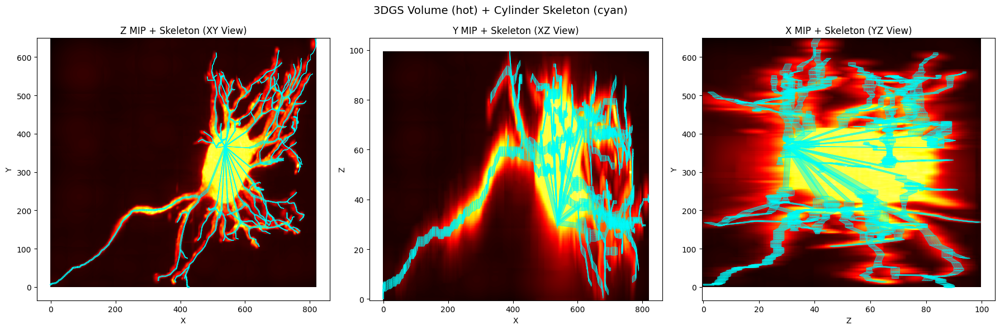

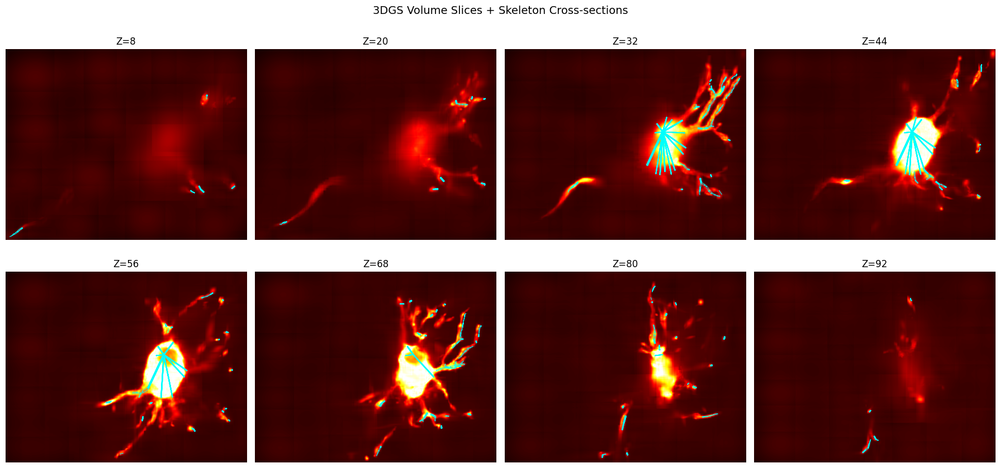

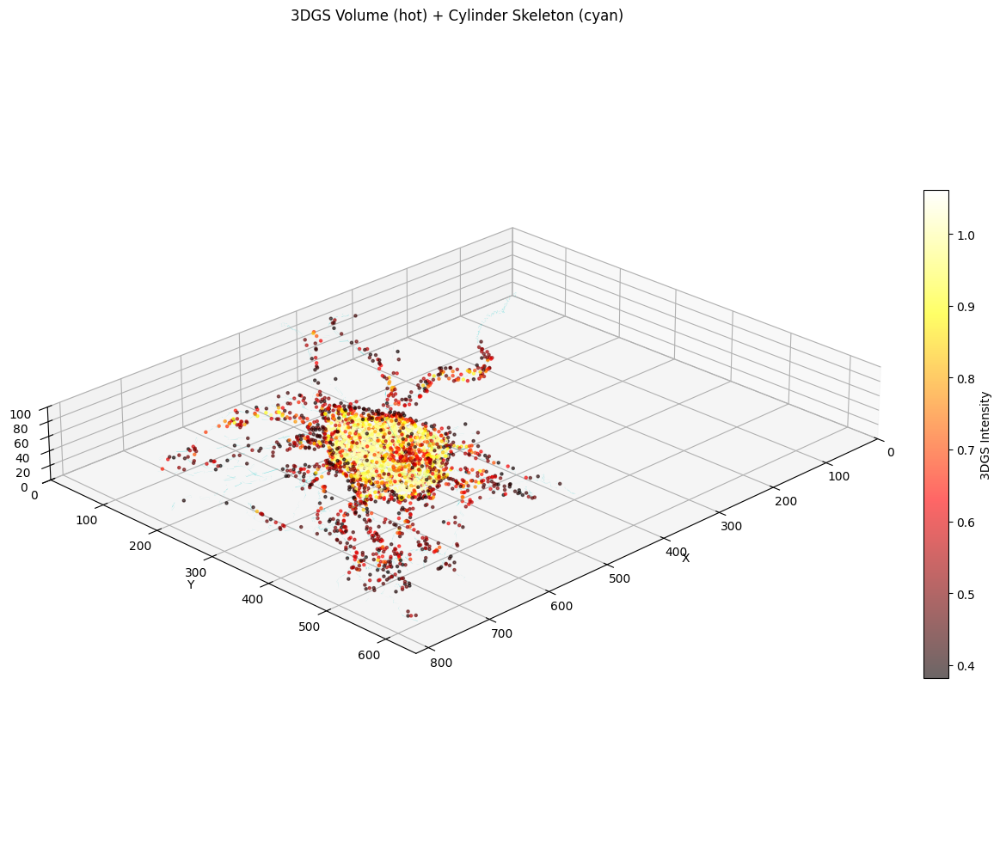


=== Summary ===
3DGS: 11477 Gaussians → (100, 650, 820) volume in 0.45s
Skeleton: 66112 triangles
High-intensity voxels (>0.38): 1798198


In [24]:
# 3DGS Volume + Cylinder Skeleton Overlay
import torch
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from stl import mesh
import sys
import time
sys.path.insert(0, '/home/armin/Documents/3DGR-CT')

from models.gaussian_model import GaussianModel

device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device}")

# Load trained 3DGS model
checkpoint_path = 'outputs/gaussian_swc/tiff/checkpoints/model_iter_15000.pth'
checkpoint = torch.load(checkpoint_path, map_location=device)

gaussians = GaussianModel()
gaussians._xyz = torch.nn.Parameter(checkpoint['xyz'].to(device))
gaussians._intensity = torch.nn.Parameter(checkpoint['intensity'].to(device))
gaussians._scaling = torch.nn.Parameter(checkpoint['scaling'].to(device))
gaussians._rotation = torch.nn.Parameter(checkpoint['rotation'].to(device))
gaussians.setup_functions()

print(f"Loaded {gaussians._xyz.shape[0]} Gaussians")

# Render 3DGS volume using CUDA kernel - FULL RESOLUTION
vol_shape = (100, 650, 820)  # Original full resolution
D, H, W = vol_shape

start_time = time.time()
zz = torch.linspace(0, 1, D, device=device)
yy = torch.linspace(0, 1, H, device=device)
xx = torch.linspace(0, 1, W, device=device)
gz, gy, gx = torch.meshgrid(zz, yy, xx, indexing='ij')
grid = torch.stack([gz, gy, gx], dim=-1).unsqueeze(0)

with torch.no_grad():
    intensity_grid = gaussians.grid_sample(grid)

render_time = time.time() - start_time
volume = intensity_grid.squeeze().cpu().numpy()
print(f"3DGS volume rendered in {render_time:.2f}s, shape: {volume.shape}")

# Load cylinder skeleton mesh
stl_path = 'skeleton_reconstruction.stl'
skeleton_mesh = mesh.Mesh.from_file(stl_path)
print(f"Loaded skeleton mesh: {len(skeleton_mesh.vectors)} triangles")

# Normalize skeleton to [0,1] coordinate space to match volume
vol_min = np.array([0.0, 206.0, 9.0])  # X, Y, Z in original coords
vol_max = np.array([812.1, 852.3, 107.6])
vol_extent = vol_max - vol_min

# Transform skeleton vertices to normalized coords
skeleton_verts = skeleton_mesh.vectors.copy()
skeleton_verts[:, :, 0] = (skeleton_verts[:, :, 0] - vol_min[0]) / vol_extent[0]  # X
skeleton_verts[:, :, 1] = (skeleton_verts[:, :, 1] - vol_min[1]) / vol_extent[1]  # Y
skeleton_verts[:, :, 2] = (skeleton_verts[:, :, 2] - vol_min[2]) / vol_extent[2]  # Z

# Scale to volume voxel coordinates
skeleton_verts[:, :, 0] *= (W - 1)  # X -> W
skeleton_verts[:, :, 1] *= (H - 1)  # Y -> H
skeleton_verts[:, :, 2] *= (D - 1)  # Z -> D

# ============ Visualization 1: MIP with skeleton overlay ============
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Z MIP (top view) - XY plane
mip_z = volume.max(axis=0)
axes[0].imshow(mip_z, cmap='hot', aspect='auto', origin='lower')
# Project skeleton onto XY (average Z of each triangle)
for tri in skeleton_verts:
    xs, ys = tri[:, 0], tri[:, 1]
    axes[0].fill(xs, ys, alpha=0.15, facecolor='cyan', edgecolor='cyan', linewidth=0.3)
axes[0].set_title('Z MIP + Skeleton (XY View)')
axes[0].set_xlabel('X')
axes[0].set_ylabel('Y')

# Y MIP (front view) - XZ plane
mip_y = volume.max(axis=1)
axes[1].imshow(mip_y, cmap='hot', aspect='auto', origin='lower')
for tri in skeleton_verts:
    xs, zs = tri[:, 0], tri[:, 2]
    axes[1].fill(xs, zs, alpha=0.15, facecolor='cyan', edgecolor='cyan', linewidth=0.3)
axes[1].set_title('Y MIP + Skeleton (XZ View)')
axes[1].set_xlabel('X')
axes[1].set_ylabel('Z')

# X MIP (side view) - YZ plane
mip_x = volume.max(axis=2)
axes[2].imshow(mip_x.T, cmap='hot', aspect='auto', origin='lower')
for tri in skeleton_verts:
    ys, zs = tri[:, 1], tri[:, 2]
    axes[2].fill(zs, ys, alpha=0.15, facecolor='cyan', edgecolor='cyan', linewidth=0.3)
axes[2].set_title('X MIP + Skeleton (YZ View)')
axes[2].set_xlabel('Z')
axes[2].set_ylabel('Y')

plt.suptitle('3DGS Volume (hot) + Cylinder Skeleton (cyan)', fontsize=14)
plt.tight_layout()
plt.show()

# ============ Visualization 2: Contour + skeleton at specific slices ============
fig, axes = plt.subplots(2, 4, figsize=(18, 9))
slice_indices = np.linspace(8, D-8, 8).astype(int)

for ax, z_idx in zip(axes.flatten(), slice_indices):
    # Show volume slice
    ax.imshow(volume[z_idx], cmap='hot', vmin=0, vmax=volume.max()*0.8, origin='lower')
    
    # Draw skeleton triangles that intersect this Z slice
    z_val = z_idx
    for tri in skeleton_verts:
        z_min, z_max = tri[:, 2].min(), tri[:, 2].max()
        if z_min <= z_val <= z_max:
            # Project triangle onto this slice
            xs, ys = tri[:, 0], tri[:, 1]
            ax.fill(xs, ys, alpha=0.3, facecolor='none', edgecolor='cyan', linewidth=0.8)
    
    ax.set_title(f'Z={z_idx}')
    ax.axis('off')

plt.suptitle('3DGS Volume Slices + Skeleton Cross-sections', fontsize=14)
plt.tight_layout()
plt.show()

# ============ Visualization 3: 3D isosurface-like view ============
fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')

# Find high-intensity voxels from 3DGS volume
threshold = 0.3 * volume.max()
high_z, high_y, high_x = np.where(volume > threshold)

# Subsample for visualization
subsample = max(1, len(high_z) // 3000)
high_z = high_z[::subsample]
high_y = high_y[::subsample]
high_x = high_x[::subsample]
intensities = volume[high_z, high_y, high_x]

# Plot 3DGS volume as scatter
scatter = ax.scatter(high_x, high_y, high_z, 
                     c=intensities, cmap='hot', s=5, alpha=0.6,
                     label=f'3DGS Voxels (n={len(high_x)})')

# Add skeleton mesh (subsampled)
skeleton_subsample = max(1, len(skeleton_verts) // 2000)
skeleton_sub = skeleton_verts[::skeleton_subsample]

# Color by Z height
z_vals = skeleton_sub[:, :, 2].mean(axis=1)
z_norm = (z_vals - z_vals.min()) / (z_vals.max() - z_vals.min() + 1e-8)
colors = np.zeros((len(skeleton_sub), 4))
colors[:, 0] = 0.0  # R
colors[:, 1] = 0.8  # G (cyan)
colors[:, 2] = 0.8  # B
colors[:, 3] = 0.4  # Alpha

mesh_collection = Poly3DCollection(skeleton_sub, facecolors=colors, edgecolors='none')
ax.add_collection3d(mesh_collection)

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('3DGS Volume (hot) + Cylinder Skeleton (cyan)')
ax.view_init(elev=25, azim=45)

# Equal aspect ratio
ax.set_xlim(0, W)
ax.set_ylim(0, H)
ax.set_zlim(0, D)
ax.set_box_aspect([W/max(W,H,D), H/max(W,H,D), D/max(W,H,D)])

plt.colorbar(scatter, ax=ax, label='3DGS Intensity', shrink=0.6)
plt.tight_layout()
plt.show()

print(f"\n=== Summary ===")
print(f"3DGS: {gaussians._xyz.shape[0]} Gaussians → {volume.shape} volume in {render_time:.2f}s")
print(f"Skeleton: {len(skeleton_mesh.vectors)} triangles")
print(f"High-intensity voxels (>{threshold:.2f}): {len(high_z) * subsample}")

Using device: cuda

=== Step 1: Rendering skeleton mesh to volume ===
Loaded skeleton mesh: 66112 triangles
Rasterizing mesh to volume...
  0/66112 triangles...
  15000/66112 triangles...
  30000/66112 triangles...
  45000/66112 triangles...
  60000/66112 triangles...
Target volume: torch.Size([100, 650, 820]), non-zero: 1127028

=== Step 2: Creating sampling grids ===
Full grid: torch.Size([1, 100, 650, 820, 3]), Low grid: torch.Size([1, 50, 325, 410, 3])

=== Step 3: Initializing Gaussians from SWC ===
Loaded SWC with 1034 nodes
SWC Position range (X,Y,Z): [   0.  206.    9.] to [ 812.135  852.262  107.616]
Radius range: 0.0690 to 2.4490
Densified skeleton to 1034 points
Created 15000 Gaussians from skeleton
Gaussian positions in (D,H,W) order, range: [0.0497, 0.9502]
Initialized 15000 Gaussians from SWC skeleton: /home/armin/Documents/3DGR-CT/10-2900-control-cell-05.oif-C0.v3dpbd.swc
  Position range: [0.0497, 0.9502]
  Scale range: [0.0064, 0.0250]
Initialized 15000 Gaussians

=== 

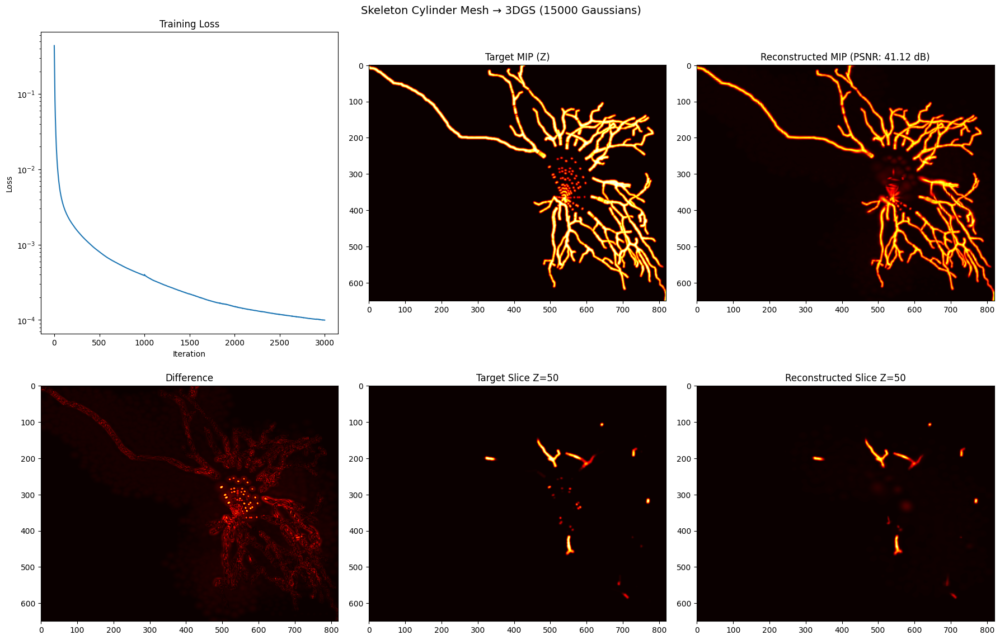


=== Summary ===
Final PSNR: 41.12 dB
Gaussians: 15000
Checkpoint saved: skeleton_cylinder_gaussians.pth


In [2]:
# Train 3D Gaussians on Skeleton Cylinder Mesh - Direct Volume Optimization
# Similar to train_ct_recon.py but using direct volume loss instead of projections

import torch
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from stl import mesh
import sys
import time
sys.path.insert(0, '/home/armin/Documents/3DGR-CT')
sys.path.insert(0, '/home/armin/Documents/3DGR-CT/3DGR-CT')

from models.gaussian_model import GaussianModel

device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device}")

# ============ Step 1: Render skeleton cylinder mesh to volume ============
print("\n=== Step 1: Rendering skeleton mesh to volume ===")
stl_path = 'skeleton_reconstruction.stl'
skeleton_mesh = mesh.Mesh.from_file(stl_path)
print(f"Loaded skeleton mesh: {len(skeleton_mesh.vectors)} triangles")

# Volume size (original)
vol_shape = (100, 650, 820)  # Z, Y, X
D, H, W = vol_shape

# Mesh bounds for coordinate mapping
vol_min = np.array([0.0, 206.0, 9.0])   # X, Y, Z in SWC coords
vol_max = np.array([812.1, 852.3, 107.6])
vol_extent = vol_max - vol_min

# Rasterize cylinder mesh to volume
print("Rasterizing mesh to volume...")

target_np = np.zeros(vol_shape, dtype=np.float32)

# Convert mesh vertices to voxel coordinates
mesh_verts = skeleton_mesh.vectors.copy()  # (N_triangles, 3, 3)
# Transform: SWC coords (X,Y,Z) -> voxel coords (x_idx, y_idx, z_idx)
mesh_verts_vox = np.zeros_like(mesh_verts)
mesh_verts_vox[:, :, 0] = (mesh_verts[:, :, 0] - vol_min[0]) / vol_extent[0] * (W - 1)  # X -> x_idx
mesh_verts_vox[:, :, 1] = (mesh_verts[:, :, 1] - vol_min[1]) / vol_extent[1] * (H - 1)  # Y -> y_idx
mesh_verts_vox[:, :, 2] = (mesh_verts[:, :, 2] - vol_min[2]) / vol_extent[2] * (D - 1)  # Z -> z_idx

# Fill voxels along each triangle
for i, tri in enumerate(mesh_verts_vox):
    # Sample points along triangle
    for alpha in np.linspace(0, 1, 5):
        for beta in np.linspace(0, 1-alpha, 5):
            gamma = 1 - alpha - beta
            pt = alpha * tri[0] + beta * tri[1] + gamma * tri[2]
            x_idx = int(np.clip(pt[0], 0, W-1))
            y_idx = int(np.clip(pt[1], 0, H-1))
            z_idx = int(np.clip(pt[2], 0, D-1))
            # Set voxel and neighbors for thickness
            for dz in range(-1, 2):
                for dy in range(-1, 2):
                    for dx in range(-1, 2):
                        zz = min(max(0, z_idx + dz), D-1)
                        yy = min(max(0, y_idx + dy), H-1)
                        xx = min(max(0, x_idx + dx), W-1)
                        target_np[zz, yy, xx] = 1.0
    
    if i % 15000 == 0:
        print(f"  {i}/{len(mesh_verts_vox)} triangles...")

# Apply Gaussian blur for smoother target
from scipy.ndimage import gaussian_filter
target_np = gaussian_filter(target_np, sigma=1.5)
target_np = target_np / (target_np.max() + 1e-8)

target_volume = torch.from_numpy(target_np).to(device)
print(f"Target volume: {target_volume.shape}, non-zero: {(target_volume > 0.01).sum().item()}")

# ============ Step 2: Create sampling grids ============
print("\n=== Step 2: Creating sampling grids ===")

# Full resolution grid
zz = torch.linspace(0, 1, D, device=device)
yy = torch.linspace(0, 1, H, device=device)
xx = torch.linspace(0, 1, W, device=device)
gz, gy, gx = torch.meshgrid(zz, yy, xx, indexing='ij')
grid = torch.stack([gz, gy, gx], dim=-1).unsqueeze(0)

# Low resolution grid for coarse stage
grid_low = grid[:, ::2, ::2, ::2, :]
target_low = target_volume[::2, ::2, ::2]
print(f"Full grid: {grid.shape}, Low grid: {grid_low.shape}")

# ============ Step 3: Initialize Gaussians from SWC ============
print("\n=== Step 3: Initializing Gaussians from SWC ===")

class OptimizationParams:
    def __init__(self):
        self.position_lr_init = 0.002
        self.position_lr_final = 0.000002
        self.position_lr_delay_mult = 0.01
        self.position_lr_max_steps = 30_000
        self.intensity_lr = 0.05
        self.scaling_lr = 0.005
        self.rotation_lr = 0.001
        self.percent_dense = 0.01

op = OptimizationParams()
gaussians = GaussianModel()

# Initialize from SWC skeleton
swc_path = '/home/armin/Documents/3DGR-CT/10-2900-control-cell-05.oif-C0.v3dpbd.swc'
gaussians.create_from_swc(
    swc_path=swc_path,
    volume_size=(D//2, H//2, W//2),
    num_samples=15000,
    ini_intensity=0.15,
    spatial_lr_scale=1.0,
    densify=True,
    points_per_unit=5.0,
    radius_based_density=True
)
gaussians.training_setup(op)
print(f"Initialized {gaussians.get_xyz.shape[0]} Gaussians")

# ============ Step 4: Training loop ============
print("\n=== Step 4: Training Gaussians ===")

def tv_regularization(volume):
    """Total variation regularization for smoothness"""
    return (torch.mean(torch.abs(volume[1:, :, :] - volume[:-1, :, :])) + 
            torch.mean(torch.abs(volume[:, 1:, :] - volume[:, :-1, :])) + 
            torch.mean(torch.abs(volume[:, :, 1:] - volume[:, :, :-1])))

# Training parameters
max_iter = 3000
low_reso_stage = 1000
tv_weight = 0.005
log_iter = 200
densification_interval = 100
densify_from_iter = 200
densify_until_iter = 2000
max_gaussians = 40000

losses = []
psnrs = []
start_time = time.time()

for iteration in range(max_iter):
    gaussians.update_learning_rate(iteration)
    
    # Coarse-to-fine training
    if iteration < low_reso_stage:
        train_output = gaussians.grid_sample(grid_low)
        target = target_low
    else:
        train_output = gaussians.grid_sample(grid)
        target = target_volume
    
    recon = train_output.squeeze()
    
    # Loss: MSE + TV regularization
    loss = torch.nn.functional.mse_loss(recon, target)
    loss += tv_weight * tv_regularization(recon)
    
    loss.backward()
    gaussians.optimizer.step()
    
    # Densification (similar to train_ct_recon.py)
    if gaussians.get_xyz.shape[0] < max_gaussians and iteration < densify_until_iter:
        if iteration > densify_from_iter and iteration % densification_interval == 0:
            gaussians.densify_and_prune(max_grad=1e-5, min_intensity=0.005, sigma_extent=2)
    
    gaussians.optimizer.zero_grad(set_to_none=True)
    
    losses.append(loss.item())
    
    # Logging
    if (iteration + 1) % log_iter == 0:
        with torch.no_grad():
            mse = torch.mean((recon - target) ** 2)
            psnr = -10 * torch.log10(mse + 1e-8)
            psnrs.append(psnr.item())
        
        elapsed = time.time() - start_time
        print(f"Iter {iteration+1}/{max_iter} | Loss: {loss.item():.6f} | PSNR: {psnr:.2f} dB | "
              f"Gaussians: {gaussians.get_xyz.shape[0]} | Time: {elapsed:.1f}s")

print(f"\nTraining complete in {time.time() - start_time:.1f}s")

# ============ Step 5: Save and visualize ============
print("\n=== Step 5: Saving results ===")

# Save checkpoint
save_path = 'skeleton_cylinder_gaussians.pth'
checkpoint = {
    'xyz': gaussians._xyz.detach().cpu(),
    'intensity': gaussians._intensity.detach().cpu(),
    'scaling': gaussians._scaling.detach().cpu(),
    'rotation': gaussians._rotation.detach().cpu(),
}
torch.save(checkpoint, save_path)
print(f"Saved checkpoint to {save_path}")

# Render final volume
with torch.no_grad():
    final_volume = gaussians.grid_sample(grid).squeeze().cpu().numpy()

# Visualize results
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Training curves
axes[0, 0].plot(losses)
axes[0, 0].set_xlabel('Iteration')
axes[0, 0].set_ylabel('Loss')
axes[0, 0].set_title('Training Loss')
axes[0, 0].set_yscale('log')

# MIP comparison
mip_target = target_np.max(axis=0)
mip_recon = final_volume.max(axis=0)
mip_diff = np.abs(mip_target - mip_recon)

axes[0, 1].imshow(mip_target, cmap='hot')
axes[0, 1].set_title('Target MIP (Z)')

axes[0, 2].imshow(mip_recon, cmap='hot')
axes[0, 2].set_title(f'Reconstructed MIP (PSNR: {psnrs[-1]:.2f} dB)')

axes[1, 0].imshow(mip_diff, cmap='hot')
axes[1, 0].set_title('Difference')

# Slice comparison
z_idx = D // 2
axes[1, 1].imshow(target_np[z_idx], cmap='hot')
axes[1, 1].set_title(f'Target Slice Z={z_idx}')

axes[1, 2].imshow(final_volume[z_idx], cmap='hot')
axes[1, 2].set_title(f'Reconstructed Slice Z={z_idx}')

plt.suptitle(f'Skeleton Cylinder Mesh → 3DGS ({gaussians.get_xyz.shape[0]} Gaussians)', fontsize=14)
plt.tight_layout()
plt.show()

print(f"\n=== Summary ===")
print(f"Final PSNR: {psnrs[-1]:.2f} dB")
print(f"Gaussians: {gaussians.get_xyz.shape[0]}")
print(f"Checkpoint saved: {save_path}")

Using device: cuda
Loaded 15000 Gaussians from skeleton_cylinder_gaussians.pth

=== Real-time Rendering Benchmark ===
Volume shape: (100, 650, 820)
Render time: 11.4 ms (87.8 FPS)
Voxels per second: 4678.0 M voxels/s

=== Generating Multi-view MIPs ===


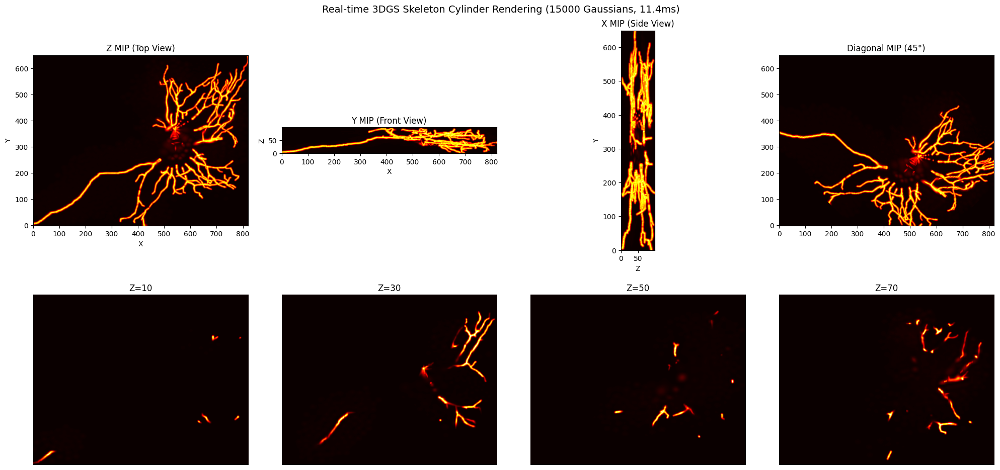


=== Gaussian Position Visualization ===


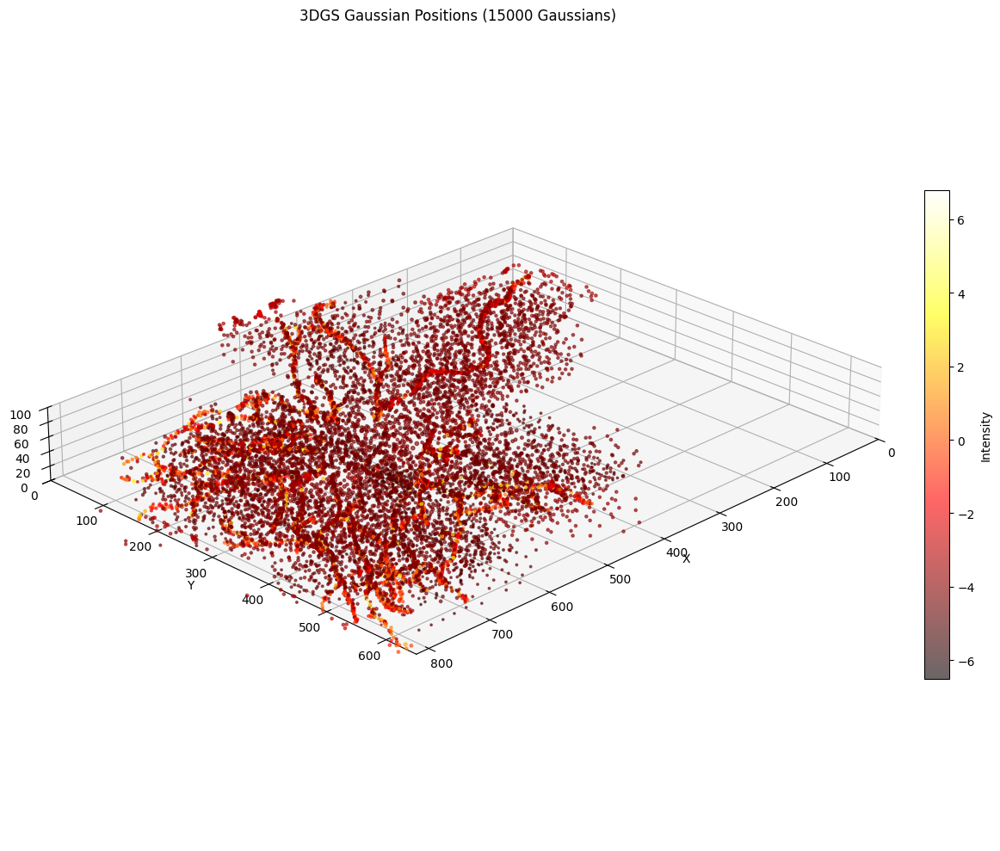


=== Gaussian Statistics ===
Number of Gaussians: 15000
Position range (voxels): X=[-69, 887], Y=[-56, 689], Z=[-9, 107]
Scale range: [0.0014, 0.0507]
Intensity range: [-6.5218, 6.7968]
Volume non-zero voxels: 3351195


In [3]:
# Real-time 3DGS Rendering of Skeleton Cylinder - Interactive Visualization
import torch
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import sys
import time
sys.path.insert(0, '/home/armin/Documents/3DGR-CT')

from models.gaussian_model import GaussianModel

device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device}")

# Load the trained skeleton Gaussians
checkpoint_path = 'skeleton_cylinder_gaussians.pth'
checkpoint = torch.load(checkpoint_path, map_location=device)

gaussians = GaussianModel()
gaussians._xyz = torch.nn.Parameter(checkpoint['xyz'].to(device))
gaussians._intensity = torch.nn.Parameter(checkpoint['intensity'].to(device))
gaussians._scaling = torch.nn.Parameter(checkpoint['scaling'].to(device))
gaussians._rotation = torch.nn.Parameter(checkpoint['rotation'].to(device))
gaussians.setup_functions()

print(f"Loaded {gaussians._xyz.shape[0]} Gaussians from {checkpoint_path}")

# ============ Real-time rendering benchmark ============
print("\n=== Real-time Rendering Benchmark ===")

vol_shape = (100, 650, 820)
D, H, W = vol_shape

# Create full resolution grid
zz = torch.linspace(0, 1, D, device=device)
yy = torch.linspace(0, 1, H, device=device)
xx = torch.linspace(0, 1, W, device=device)
gz, gy, gx = torch.meshgrid(zz, yy, xx, indexing='ij')
grid = torch.stack([gz, gy, gx], dim=-1).unsqueeze(0)

# Benchmark rendering speed
n_renders = 10
torch.cuda.synchronize()
start = time.time()
for _ in range(n_renders):
    with torch.no_grad():
        volume = gaussians.grid_sample(grid)
    torch.cuda.synchronize()
elapsed = time.time() - start

fps = n_renders / elapsed
render_time = elapsed / n_renders * 1000
print(f"Volume shape: {vol_shape}")
print(f"Render time: {render_time:.1f} ms ({fps:.1f} FPS)")
print(f"Voxels per second: {D*H*W / (render_time/1000) / 1e6:.1f} M voxels/s")

volume = volume.squeeze().cpu().numpy()

# ============ Multi-view MIP visualization ============
print("\n=== Generating Multi-view MIPs ===")

fig = plt.figure(figsize=(20, 10))

# View 1: Z MIP (top view)
ax1 = fig.add_subplot(2, 4, 1)
mip_z = volume.max(axis=0)
ax1.imshow(mip_z, cmap='hot', origin='lower')
ax1.set_title('Z MIP (Top View)')
ax1.set_xlabel('X')
ax1.set_ylabel('Y')

# View 2: Y MIP (front view) 
ax2 = fig.add_subplot(2, 4, 2)
mip_y = volume.max(axis=1)
ax2.imshow(mip_y, cmap='hot', origin='lower')
ax2.set_title('Y MIP (Front View)')
ax2.set_xlabel('X')
ax2.set_ylabel('Z')

# View 3: X MIP (side view)
ax3 = fig.add_subplot(2, 4, 3)
mip_x = volume.max(axis=2)
ax3.imshow(mip_x.T, cmap='hot', origin='lower')
ax3.set_title('X MIP (Side View)')
ax3.set_xlabel('Z')
ax3.set_ylabel('Y')

# View 4: Diagonal MIP
ax4 = fig.add_subplot(2, 4, 4)
# Rotate volume 45 degrees and take MIP
from scipy.ndimage import rotate
vol_rot = rotate(volume, 45, axes=(1, 2), reshape=False)
mip_diag = vol_rot.max(axis=0)
ax4.imshow(mip_diag, cmap='hot', origin='lower')
ax4.set_title('Diagonal MIP (45°)')

# Z-slices
slices = [10, 30, 50, 70]
for i, z_idx in enumerate(slices):
    ax = fig.add_subplot(2, 4, 5 + i)
    ax.imshow(volume[z_idx], cmap='hot', origin='lower', vmin=0, vmax=volume.max()*0.8)
    ax.set_title(f'Z={z_idx}')
    ax.axis('off')

plt.suptitle(f'Real-time 3DGS Skeleton Cylinder Rendering ({gaussians._xyz.shape[0]} Gaussians, {render_time:.1f}ms)', fontsize=14)
plt.tight_layout()
plt.show()

# ============ 3D Scatter visualization of Gaussian positions ============
print("\n=== Gaussian Position Visualization ===")

fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')

# Get Gaussian positions and properties
xyz = gaussians._xyz.detach().cpu().numpy()
scales = torch.exp(gaussians._scaling).detach().cpu().numpy()
intensities = gaussians._intensity.detach().cpu().numpy().flatten()

# Denormalize positions to voxel coords
vol_min = np.array([0.0, 206.0, 9.0])
vol_max = np.array([812.1, 852.3, 107.6])
vol_extent = vol_max - vol_min

margin = 0.05
# xyz is in (D, H, W) = (Z, Y, X) normalized coords
gauss_z = (xyz[:, 0] - margin) / (1 - 2*margin) * (D - 1)
gauss_y = (xyz[:, 1] - margin) / (1 - 2*margin) * (H - 1)
gauss_x = (xyz[:, 2] - margin) / (1 - 2*margin) * (W - 1)

# Color by intensity, size by scale
scatter = ax.scatter(gauss_x, gauss_y, gauss_z, 
                     c=intensities, cmap='hot', 
                     s=scales.mean(axis=1) * 500,
                     alpha=0.6)

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title(f'3DGS Gaussian Positions ({len(xyz)} Gaussians)')
ax.view_init(elev=25, azim=45)

# Equal aspect
ax.set_xlim(0, W)
ax.set_ylim(0, H)
ax.set_zlim(0, D)
ax.set_box_aspect([W/max(W,H,D), H/max(W,H,D), D/max(W,H,D)])

plt.colorbar(scatter, ax=ax, label='Intensity', shrink=0.6)
plt.tight_layout()
plt.show()

# ============ Statistics ============
print("\n=== Gaussian Statistics ===")
print(f"Number of Gaussians: {len(xyz)}")
print(f"Position range (voxels): X=[{gauss_x.min():.0f}, {gauss_x.max():.0f}], "
      f"Y=[{gauss_y.min():.0f}, {gauss_y.max():.0f}], Z=[{gauss_z.min():.0f}, {gauss_z.max():.0f}]")
print(f"Scale range: [{scales.min():.4f}, {scales.max():.4f}]")
print(f"Intensity range: [{intensities.min():.4f}, {intensities.max():.4f}]")
print(f"Volume non-zero voxels: {(volume > 0.01).sum()}")

In [5]:
# Grayscale MIP Pixel Rendering of Gaussians - HTTP Server
import torch
import numpy as np
from PIL import Image
import sys
import os
sys.path.insert(0, '/home/armin/Documents/3DGR-CT')

from models.gaussian_model import GaussianModel

device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device}")

# Load the trained skeleton Gaussians
checkpoint_path = 'skeleton_cylinder_gaussians.pth'
checkpoint = torch.load(checkpoint_path, map_location=device)

gaussians = GaussianModel()
gaussians._xyz = torch.nn.Parameter(checkpoint['xyz'].to(device))
gaussians._intensity = torch.nn.Parameter(checkpoint['intensity'].to(device))
gaussians._scaling = torch.nn.Parameter(checkpoint['scaling'].to(device))
gaussians._rotation = torch.nn.Parameter(checkpoint['rotation'].to(device))
gaussians.setup_functions()

print(f"Loaded {gaussians._xyz.shape[0]} Gaussians")

# Render volume
vol_shape = (100, 650, 820)
D, H, W = vol_shape

zz = torch.linspace(0, 1, D, device=device)
yy = torch.linspace(0, 1, H, device=device)
xx = torch.linspace(0, 1, W, device=device)
gz, gy, gx = torch.meshgrid(zz, yy, xx, indexing='ij')
grid = torch.stack([gz, gy, gx], dim=-1).unsqueeze(0)

print("Rendering volume...")
with torch.no_grad():
    volume = gaussians.grid_sample(grid).squeeze().cpu().numpy()

print(f"Volume shape: {volume.shape}, range: [{volume.min():.4f}, {volume.max():.4f}]")

# Create grayscale MIP images
output_dir = 'mip_output'
os.makedirs(output_dir, exist_ok=True)

# Normalize volume
volume_norm = (volume - volume.min()) / (volume.max() - volume.min() + 1e-8)

# Z MIP (top view)
mip_z = volume_norm.max(axis=0)
mip_z_uint8 = (mip_z * 255).astype(np.uint8)
Image.fromarray(mip_z_uint8).save(f'{output_dir}/mip_z.png')

# Y MIP (front view)
mip_y = volume_norm.max(axis=1)
mip_y_uint8 = (mip_y * 255).astype(np.uint8)
Image.fromarray(mip_y_uint8).save(f'{output_dir}/mip_y.png')

# X MIP (side view)
mip_x = volume_norm.max(axis=2).T
mip_x_uint8 = (mip_x * 255).astype(np.uint8)
Image.fromarray(mip_x_uint8).save(f'{output_dir}/mip_x.png')

print(f"Saved MIP images to {output_dir}/")

# Create HTML viewer
html_content = '''<!DOCTYPE html>
<html>
<head>
    <title>3DGS Skeleton MIP Viewer</title>
    <style>
        body { 
            background: #111; 
            color: #fff; 
            font-family: Arial, sans-serif;
            margin: 0;
            padding: 20px;
        }
        h1 { color: #0af; text-align: center; }
        .container { 
            display: flex; 
            flex-wrap: wrap; 
            justify-content: center; 
            gap: 20px;
            margin-top: 20px;
        }
        .mip-view {
            text-align: center;
            background: #222;
            padding: 15px;
            border-radius: 10px;
        }
        .mip-view img { 
            max-width: 100%;
            height: auto;
            border: 2px solid #333;
        }
        .mip-view h3 { margin: 10px 0; color: #0af; }
        .info {
            text-align: center;
            margin-top: 20px;
            color: #888;
        }
    </style>
</head>
<body>
    <h1>3DGS Skeleton Cylinder - Grayscale MIP Rendering</h1>
    <div class="container">
        <div class="mip-view">
            <h3>Z MIP (Top View - XY)</h3>
            <img src="mip_z.png" alt="Z MIP">
        </div>
        <div class="mip-view">
            <h3>Y MIP (Front View - XZ)</h3>
            <img src="mip_y.png" alt="Y MIP">
        </div>
        <div class="mip-view">
            <h3>X MIP (Side View - YZ)</h3>
            <img src="mip_x.png" alt="X MIP">
        </div>
    </div>
    <div class="info">
        <p>Volume: 100 x 650 x 820 | Gaussians: ''' + str(gaussians._xyz.shape[0]) + '''</p>
        <p>Rendered with 3D Gaussian Splatting CUDA kernel</p>
    </div>
</body>
</html>'''

with open(f'{output_dir}/index.html', 'w') as f:
    f.write(html_content)

print(f"Created HTML viewer at {output_dir}/index.html")
print(f"\nTo view, run: cd {output_dir} && python -m http.server 8080")
print("Then open: http://localhost:8080")

Using device: cuda
Loaded 15000 Gaussians
Rendering volume...
Volume shape: (100, 650, 820), range: [0.0000, 1.3072]
Saved MIP images to mip_output/
Created HTML viewer at mip_output/index.html

To view, run: cd mip_output && python -m http.server 8080
Then open: http://localhost:8080


In [6]:
# Interactive 3DGS MIP Viewer with Real-time Rotation
import torch
import numpy as np
from PIL import Image
import sys
import os
import json
sys.path.insert(0, '/home/armin/Documents/3DGR-CT')

from models.gaussian_model import GaussianModel

device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device}")

# Load the trained skeleton Gaussians
checkpoint_path = 'skeleton_cylinder_gaussians.pth'
checkpoint = torch.load(checkpoint_path, map_location=device)

gaussians = GaussianModel()
gaussians._xyz = torch.nn.Parameter(checkpoint['xyz'].to(device))
gaussians._intensity = torch.nn.Parameter(checkpoint['intensity'].to(device))
gaussians._scaling = torch.nn.Parameter(checkpoint['scaling'].to(device))
gaussians._rotation = torch.nn.Parameter(checkpoint['rotation'].to(device))
gaussians.setup_functions()

print(f"Loaded {gaussians._xyz.shape[0]} Gaussians")

# Render volume at lower resolution for faster interaction
vol_shape = (100, 650, 820)
D, H, W = vol_shape

zz = torch.linspace(0, 1, D, device=device)
yy = torch.linspace(0, 1, H, device=device)
xx = torch.linspace(0, 1, W, device=device)
gz, gy, gx = torch.meshgrid(zz, yy, xx, indexing='ij')
grid = torch.stack([gz, gy, gx], dim=-1).unsqueeze(0)

print("Rendering volume...")
with torch.no_grad():
    volume = gaussians.grid_sample(grid).squeeze().cpu().numpy()

# Normalize
volume = (volume - volume.min()) / (volume.max() - volume.min() + 1e-8)
print(f"Volume: {volume.shape}")

# Save volume as raw binary for WebGL
output_dir = 'interactive_viewer'
os.makedirs(output_dir, exist_ok=True)

volume_uint8 = (volume * 255).astype(np.uint8)
volume_uint8.tofile(f'{output_dir}/volume.raw')

# Save dimensions
dims = {'z': D, 'y': H, 'x': W}
with open(f'{output_dir}/dims.json', 'w') as f:
    json.dump(dims, f)

# Create interactive HTML viewer with WebGL ray marching
html_content = '''<!DOCTYPE html>
<html>
<head>
    <title>Interactive 3DGS MIP Viewer</title>
    <style>
        * { margin: 0; padding: 0; box-sizing: border-box; }
        body { background: #000; overflow: hidden; font-family: Arial, sans-serif; }
        #canvas { width: 100vw; height: 100vh; display: block; }
        #controls {
            position: absolute; top: 20px; left: 20px;
            background: rgba(0,0,0,0.8); padding: 15px; border-radius: 10px;
            color: #fff; font-size: 13px;
        }
        #controls h2 { color: #0af; margin-bottom: 10px; font-size: 16px; }
        #controls label { display: block; margin: 8px 0 3px; color: #aaa; }
        #controls input[type="range"] { width: 150px; }
        #controls .val { color: #0af; }
        #info {
            position: absolute; bottom: 20px; left: 20px;
            color: #666; font-size: 12px;
        }
        #loading {
            position: absolute; top: 50%; left: 50%;
            transform: translate(-50%, -50%);
            color: #fff; font-size: 20px;
        }
    </style>
</head>
<body>
    <div id="loading">Loading volume...</div>
    <canvas id="canvas"></canvas>
    <div id="controls" style="display:none;">
        <h2>3DGS Skeleton MIP</h2>
        <label>Brightness: <span class="val" id="brightVal">1.5</span></label>
        <input type="range" id="brightness" min="0.5" max="5" step="0.1" value="1.5">
        <label>Threshold: <span class="val" id="threshVal">0.00</span></label>
        <input type="range" id="threshold" min="0" max="0.3" step="0.01" value="0">
        <label>Rotation Speed: <span class="val" id="speedVal">1.0</span></label>
        <input type="range" id="speed" min="0" max="3" step="0.1" value="1">
        <p style="margin-top:10px; color:#666;">Drag to rotate | Scroll to zoom</p>
    </div>
    <div id="info">Volume: ''' + f'{D}x{H}x{W}' + ''' | Gaussians: ''' + str(gaussians._xyz.shape[0]) + '''</div>

<script id="vs" type="x-shader/x-vertex">#version 300 es
in vec2 aPos;
out vec2 vUV;
void main() {
    vUV = aPos * 0.5 + 0.5;
    gl_Position = vec4(aPos, 0.0, 1.0);
}
</script>

<script id="fs" type="x-shader/x-fragment">#version 300 es
precision highp float;
precision highp sampler3D;
in vec2 vUV;
out vec4 fragColor;

uniform sampler3D uVolume;
uniform mat3 uRotation;
uniform float uZoom;
uniform float uBrightness;
uniform float uThreshold;
uniform vec3 uAspect;
uniform vec2 uResolution;

const int MAX_STEPS = 400;
const float STEP_SIZE = 0.003;

vec2 intersectBox(vec3 ro, vec3 rd, vec3 boxMin, vec3 boxMax) {
    vec3 tMin = (boxMin - ro) / rd;
    vec3 tMax = (boxMax - ro) / rd;
    vec3 t1 = min(tMin, tMax);
    vec3 t2 = max(tMin, tMax);
    float tNear = max(max(t1.x, t1.y), t1.z);
    float tFar = min(min(t2.x, t2.y), t2.z);
    return vec2(tNear, tFar);
}

void main() {
    vec2 uv = (vUV - 0.5) * 2.0;
    uv.x *= uResolution.x / uResolution.y;
    
    vec3 ro = vec3(0.0, 0.0, uZoom);
    vec3 rd = normalize(vec3(uv * 0.7, -1.0));
    
    ro = uRotation * ro;
    rd = uRotation * rd;
    
    vec3 boxMin = -uAspect * 0.5;
    vec3 boxMax = uAspect * 0.5;
    
    vec2 tHit = intersectBox(ro, rd, boxMin, boxMax);
    
    if (tHit.x > tHit.y || tHit.y < 0.0) {
        fragColor = vec4(0.0, 0.0, 0.0, 1.0);
        return;
    }
    
    tHit.x = max(tHit.x, 0.0);
    
    float maxVal = 0.0;
    
    for (int i = 0; i < MAX_STEPS; i++) {
        float t = tHit.x + float(i) * STEP_SIZE;
        if (t > tHit.y) break;
        
        vec3 pos = ro + rd * t;
        vec3 texCoord = (pos - boxMin) / (boxMax - boxMin);
        
        float val = texture(uVolume, texCoord).r;
        val = max(0.0, val - uThreshold);
        maxVal = max(maxVal, val);
    }
    
    float intensity = maxVal * uBrightness;
    fragColor = vec4(vec3(intensity), 1.0);
}
</script>

<script>
(function() {
    const canvas = document.getElementById('canvas');
    const gl = canvas.getContext('webgl2');
    
    if (!gl) {
        document.getElementById('loading').textContent = 'WebGL2 not supported';
        return;
    }
    
    let volumeTexture;
    let program, vao;
    let rotX = 0.3, rotY = 0;
    let zoom = 2.0;
    let brightness = 1.5, threshold = 0, speed = 1;
    let dragging = false, lastX, lastY;
    const dims = {x: ''' + str(W) + ''', y: ''' + str(H) + ''', z: ''' + str(D) + '''};
    const maxDim = Math.max(dims.x, dims.y, dims.z);
    const aspect = {x: dims.x/maxDim, y: dims.y/maxDim, z: dims.z/maxDim};
    
    function createShader(type, id) {
        const src = document.getElementById(id).textContent;
        const shader = gl.createShader(type);
        gl.shaderSource(shader, src);
        gl.compileShader(shader);
        if (!gl.getShaderParameter(shader, gl.COMPILE_STATUS)) {
            console.error(gl.getShaderInfoLog(shader));
            return null;
        }
        return shader;
    }
    
    function init() {
        const vs = createShader(gl.VERTEX_SHADER, 'vs');
        const fs = createShader(gl.FRAGMENT_SHADER, 'fs');
        program = gl.createProgram();
        gl.attachShader(program, vs);
        gl.attachShader(program, fs);
        gl.linkProgram(program);
        
        const pos = new Float32Array([-1,-1, 1,-1, -1,1, 1,1]);
        vao = gl.createVertexArray();
        gl.bindVertexArray(vao);
        const buf = gl.createBuffer();
        gl.bindBuffer(gl.ARRAY_BUFFER, buf);
        gl.bufferData(gl.ARRAY_BUFFER, pos, gl.STATIC_DRAW);
        const loc = gl.getAttribLocation(program, 'aPos');
        gl.enableVertexAttribArray(loc);
        gl.vertexAttribPointer(loc, 2, gl.FLOAT, false, 0, 0);
    }
    
    function loadVolume() {
        return fetch('volume.raw')
            .then(r => r.arrayBuffer())
            .then(buf => {
                const data = new Uint8Array(buf);
                volumeTexture = gl.createTexture();
                gl.bindTexture(gl.TEXTURE_3D, volumeTexture);
                gl.texParameteri(gl.TEXTURE_3D, gl.TEXTURE_MIN_FILTER, gl.LINEAR);
                gl.texParameteri(gl.TEXTURE_3D, gl.TEXTURE_MAG_FILTER, gl.LINEAR);
                gl.texParameteri(gl.TEXTURE_3D, gl.TEXTURE_WRAP_S, gl.CLAMP_TO_EDGE);
                gl.texParameteri(gl.TEXTURE_3D, gl.TEXTURE_WRAP_T, gl.CLAMP_TO_EDGE);
                gl.texParameteri(gl.TEXTURE_3D, gl.TEXTURE_WRAP_R, gl.CLAMP_TO_EDGE);
                gl.texImage3D(gl.TEXTURE_3D, 0, gl.R8, dims.x, dims.y, dims.z, 0, gl.RED, gl.UNSIGNED_BYTE, data);
                return true;
            });
    }
    
    function makeRotation(rx, ry) {
        const cx = Math.cos(rx), sx = Math.sin(rx);
        const cy = Math.cos(ry), sy = Math.sin(ry);
        return new Float32Array([
            cy, 0, sy,
            sx*sy, cx, -sx*cy,
            -cx*sy, sx, cx*cy
        ]);
    }
    
    function render() {
        canvas.width = window.innerWidth;
        canvas.height = window.innerHeight;
        gl.viewport(0, 0, canvas.width, canvas.height);
        
        gl.clearColor(0, 0, 0, 1);
        gl.clear(gl.COLOR_BUFFER_BIT);
        
        rotY += 0.003 * speed;
        
        gl.useProgram(program);
        gl.bindVertexArray(vao);
        
        gl.activeTexture(gl.TEXTURE0);
        gl.bindTexture(gl.TEXTURE_3D, volumeTexture);
        gl.uniform1i(gl.getUniformLocation(program, 'uVolume'), 0);
        
        gl.uniformMatrix3fv(gl.getUniformLocation(program, 'uRotation'), false, makeRotation(rotX, rotY));
        gl.uniform1f(gl.getUniformLocation(program, 'uZoom'), zoom);
        gl.uniform1f(gl.getUniformLocation(program, 'uBrightness'), brightness);
        gl.uniform1f(gl.getUniformLocation(program, 'uThreshold'), threshold);
        gl.uniform3f(gl.getUniformLocation(program, 'uAspect'), aspect.x, aspect.y, aspect.z);
        gl.uniform2f(gl.getUniformLocation(program, 'uResolution'), canvas.width, canvas.height);
        
        gl.drawArrays(gl.TRIANGLE_STRIP, 0, 4);
        requestAnimationFrame(render);
    }
    
    canvas.addEventListener('mousedown', e => { dragging = true; lastX = e.clientX; lastY = e.clientY; });
    canvas.addEventListener('mousemove', e => {
        if (!dragging) return;
        rotY += (e.clientX - lastX) * 0.01;
        rotX += (e.clientY - lastY) * 0.01;
        rotX = Math.max(-Math.PI/2, Math.min(Math.PI/2, rotX));
        lastX = e.clientX; lastY = e.clientY;
    });
    canvas.addEventListener('mouseup', () => dragging = false);
    canvas.addEventListener('mouseleave', () => dragging = false);
    canvas.addEventListener('wheel', e => {
        e.preventDefault();
        zoom *= e.deltaY > 0 ? 1.1 : 0.9;
        zoom = Math.max(0.5, Math.min(5, zoom));
    });
    
    document.getElementById('brightness').addEventListener('input', e => {
        brightness = parseFloat(e.target.value);
        document.getElementById('brightVal').textContent = brightness.toFixed(1);
    });
    document.getElementById('threshold').addEventListener('input', e => {
        threshold = parseFloat(e.target.value);
        document.getElementById('threshVal').textContent = threshold.toFixed(2);
    });
    document.getElementById('speed').addEventListener('input', e => {
        speed = parseFloat(e.target.value);
        document.getElementById('speedVal').textContent = speed.toFixed(1);
    });
    
    init();
    loadVolume().then(() => {
        document.getElementById('loading').style.display = 'none';
        document.getElementById('controls').style.display = 'block';
        render();
    });
})();
</script>
</body>
</html>'''

with open(f'{output_dir}/index.html', 'w') as f:
    f.write(html_content)

print(f"\nCreated interactive viewer at {output_dir}/")
print(f"Volume size: {volume_uint8.nbytes / 1024 / 1024:.1f} MB")
print(f"\nRun: cd {output_dir} && python -m http.server 8888")
print("Open: http://localhost:8888")

Using device: cuda
Loaded 15000 Gaussians
Rendering volume...
Volume: (100, 650, 820)

Created interactive viewer at interactive_viewer/
Volume size: 50.8 MB

Run: cd interactive_viewer && python -m http.server 8888
Open: http://localhost:8888


Loaded 1034 nodes from SWC file


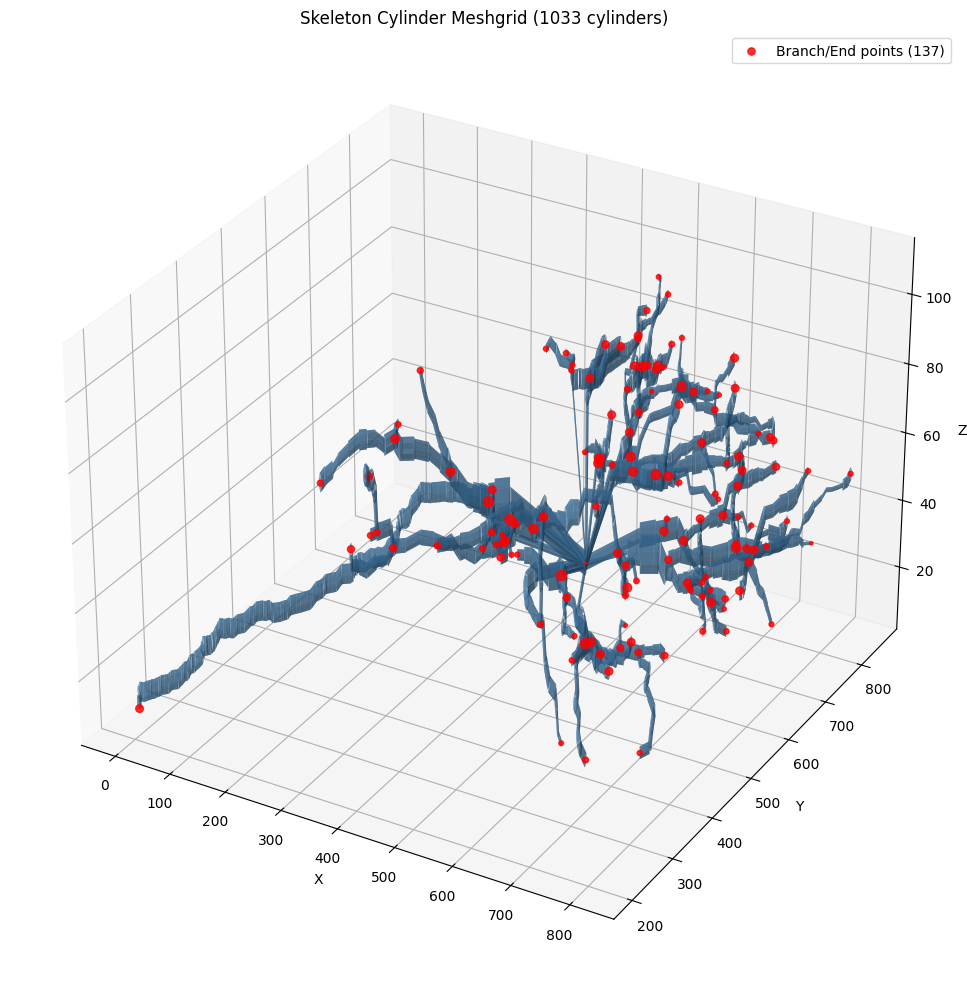

Created 1033 cylinder meshes


In [7]:
# Create proper cylinder meshgrid for skeleton visualization
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def create_cylinder_mesh(start, end, radius, n_theta=12, n_length=2):
    """Create cylinder mesh vertices between start and end points."""
    # Direction vector
    v = end - start
    length = np.linalg.norm(v)
    if length < 1e-8:
        return None, None
    v_norm = v / length
    
    # Find perpendicular vectors using Gram-Schmidt
    # Pick a vector not parallel to v
    if abs(v_norm[0]) < 0.9:
        perp1 = np.array([1, 0, 0])
    else:
        perp1 = np.array([0, 1, 0])
    
    # Make it perpendicular to v
    perp1 = perp1 - np.dot(perp1, v_norm) * v_norm
    perp1 = perp1 / np.linalg.norm(perp1)
    
    # Second perpendicular vector
    perp2 = np.cross(v_norm, perp1)
    
    # Create cylinder mesh
    theta = np.linspace(0, 2 * np.pi, n_theta)
    t = np.linspace(0, 1, n_length)
    
    Theta, T = np.meshgrid(theta, t)
    
    # Parametric cylinder
    X = start[0] + T * v[0] + radius * (np.cos(Theta) * perp1[0] + np.sin(Theta) * perp2[0])
    Y = start[1] + T * v[1] + radius * (np.cos(Theta) * perp1[1] + np.sin(Theta) * perp2[1])
    Z = start[2] + T * v[2] + radius * (np.cos(Theta) * perp1[2] + np.sin(Theta) * perp2[2])
    
    return (X, Y, Z), (Theta, T)

# Load SWC nodes
swc_path = '10-2900-control-cell-05.oif-C0.v3dpbd.swc'
nodes = []
with open(swc_path, 'r') as f:
    for line in f:
        line = line.strip()
        if not line or line.startswith('#'):
            continue
        parts = line.split()
        if len(parts) >= 7:
            node = {
                'id': int(parts[0]),
                'type': int(parts[1]),
                'x': float(parts[2]),
                'y': float(parts[3]),
                'z': float(parts[4]),
                'radius': float(parts[5]),
                'parent': int(parts[6])
            }
            nodes.append(node)

print(f"Loaded {len(nodes)} nodes from SWC file")
id_to_idx = {n['id']: i for i, n in enumerate(nodes)}

# Create 3D figure with cylinder meshes
fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')

# Draw cylinders for each connection
cylinder_count = 0
radius_scale = 3.0  # Scale up radii for visibility

for node in nodes:
    if node['parent'] > 0 and node['parent'] in id_to_idx:
        parent_idx = id_to_idx[node['parent']]
        child_idx = id_to_idx[node['id']]
        
        start = np.array([nodes[parent_idx]['x'], nodes[parent_idx]['y'], nodes[parent_idx]['z']])
        end = np.array([nodes[child_idx]['x'], nodes[child_idx]['y'], nodes[child_idx]['z']])
        radius = (nodes[parent_idx]['radius'] + nodes[child_idx]['radius']) / 2.0 * radius_scale
        
        mesh, _ = create_cylinder_mesh(start, end, radius, n_theta=8, n_length=2)
        if mesh is not None:
            X, Y, Z = mesh
            ax.plot_surface(X, Y, Z, alpha=0.6, color='steelblue', edgecolor='none')
            cylinder_count += 1

# Also draw spheres at branch points (nodes with multiple children or endpoints)
child_count = {n['id']: 0 for n in nodes}
for n in nodes:
    if n['parent'] > 0 and n['parent'] in child_count:
        child_count[n['parent']] += 1

# Find branch points (>1 child) and endpoints (0 children)
branch_points = [n for n in nodes if child_count[n['id']] > 1 or child_count[n['id']] == 0]
bp_positions = np.array([[n['x'], n['y'], n['z']] for n in branch_points])
bp_radii = np.array([n['radius'] * radius_scale for n in branch_points])

if len(bp_positions) > 0:
    ax.scatter(bp_positions[:, 0], bp_positions[:, 1], bp_positions[:, 2], 
               s=bp_radii * 10, c='red', alpha=0.8, label=f'Branch/End points ({len(branch_points)})')

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title(f'Skeleton Cylinder Meshgrid ({cylinder_count} cylinders)')
ax.legend()
plt.tight_layout()
plt.show()

print(f"Created {cylinder_count} cylinder meshes")

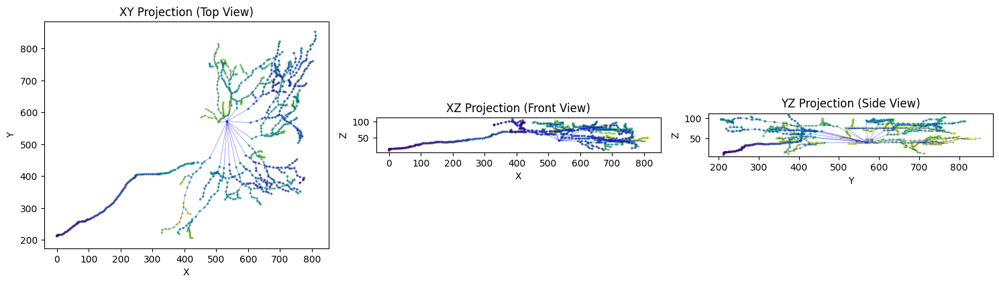

In [34]:
# Show 2D projections: XY, XZ, YZ
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# XY projection (top view)
ax = axes[0]
for node in nodes:
    if node['parent'] > 0 and node['parent'] in id_to_idx:
        parent_idx = id_to_idx[node['parent']]
        child_idx = id_to_idx[node['id']]
        ax.plot([positions[parent_idx, 0], positions[child_idx, 0]],
                [positions[parent_idx, 1], positions[child_idx, 1]],
                'b-', linewidth=0.5, alpha=0.5)
ax.scatter(positions[:,0], positions[:,1], c=positions[:,2], cmap='viridis', s=3, alpha=0.7)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_title('XY Projection (Top View)')
ax.set_aspect('equal')

# XZ projection (front view)
ax = axes[1]
for node in nodes:
    if node['parent'] > 0 and node['parent'] in id_to_idx:
        parent_idx = id_to_idx[node['parent']]
        child_idx = id_to_idx[node['id']]
        ax.plot([positions[parent_idx, 0], positions[child_idx, 0]],
                [positions[parent_idx, 2], positions[child_idx, 2]],
                'b-', linewidth=0.5, alpha=0.5)
ax.scatter(positions[:,0], positions[:,2], c=positions[:,1], cmap='viridis', s=3, alpha=0.7)
ax.set_xlabel('X')
ax.set_ylabel('Z')
ax.set_title('XZ Projection (Front View)')
ax.set_aspect('equal')

# YZ projection (side view)
ax = axes[2]
for node in nodes:
    if node['parent'] > 0 and node['parent'] in id_to_idx:
        parent_idx = id_to_idx[node['parent']]
        child_idx = id_to_idx[node['id']]
        ax.plot([positions[parent_idx, 1], positions[child_idx, 1]],
                [positions[parent_idx, 2], positions[child_idx, 2]],
                'b-', linewidth=0.5, alpha=0.5)
ax.scatter(positions[:,1], positions[:,2], c=positions[:,0], cmap='viridis', s=3, alpha=0.7)
ax.set_xlabel('Y')
ax.set_ylabel('Z')
ax.set_title('YZ Projection (Side View)')
ax.set_aspect('equal')

plt.tight_layout()
plt.show()

Loaded SWC with 1034 nodes
SWC Position range (X,Y,Z): [  0. 206.   9.] to [812.135 852.262 107.616]
Radius range: 0.0690 to 2.4490
Densified skeleton to 1034 points
Created 50000 Gaussians from skeleton
Gaussian positions in (D,H,W) order, range: [0.0498, 0.9501]

Created 50000 Gaussian positions from skeleton
Position range (D,H,W): [0.0498, 0.9501]
Scale range: [0.0056, 0.0250]

Volume bounds (D,H,W): min=[  9. 206.   0.], max=[107.6 852.3 812.1]
Denormalized Gaussian range: X=[-0.1, 812.2], Y=[205.9, 852.3], Z=[9.0, 107.6]
Original SWC range:          X=[0.0, 812.1], Y=[206.0, 852.3], Z=[9.0, 107.6]


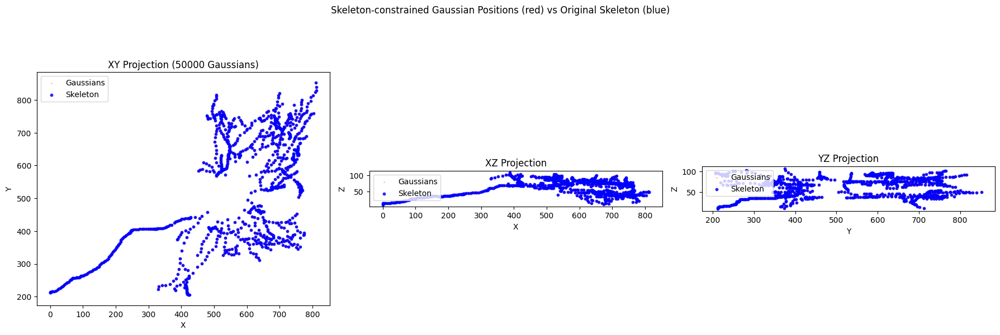

: 

In [ ]:
# Clone/sample new points along skeleton according to skeleton constraint
# Uses the same method as our SWC-based Gaussian initialization

import sys
import torch
import importlib

# Reload swc_utils to pick up the fix
sys.path.insert(0, '/home/armin/Documents/3DGR-CT')
import swc_utils
importlib.reload(swc_utils)
from swc_utils import create_gaussian_params_from_swc

# Generate Gaussian positions from skeleton (same as training)
swc_path = '/home/armin/Documents/3DGR-CT/10-2900-control-cell-05.oif-C0.v3dpbd.swc'
num_gaussians = 50000

gaussian_params = create_gaussian_params_from_swc(
    swc_path=swc_path,
    num_gaussians=num_gaussians,
    volume_size=(100, 650, 820),  # (D, H, W) = (Z, Y, X)
    ini_intensity=0.02,
    densify=True,
    points_per_unit=5.0,
    radius_based_density=True
)

# Extract positions - NOW in (D, H, W) = (Z, Y, X) order after the fix
gaussian_positions = gaussian_params['xyz'].cpu().numpy()
gaussian_scales = torch.exp(gaussian_params['scaling']).cpu().numpy()

print(f"\nCreated {len(gaussian_positions)} Gaussian positions from skeleton")
print(f"Position range (D,H,W): [{gaussian_positions.min():.4f}, {gaussian_positions.max():.4f}]")
print(f"Scale range: [{gaussian_scales.min():.4f}, {gaussian_scales.max():.4f}]")

# Denormalize positions for visualization
# Gaussian positions are now in (D, H, W) = (Z, Y, X) order
# SWC skeleton positions are in (X, Y, Z) order
# We need to convert to SWC coordinate system for comparison

# Volume bounds in (D, H, W) order - from image crop
vol_min_dhw = np.array([9.0, 206.0, 0.0])    # D=Z, H=Y, W=X
vol_max_dhw = np.array([107.6, 852.3, 812.1])
vol_extent = vol_max_dhw - vol_min_dhw

print(f"\nVolume bounds (D,H,W): min={vol_min_dhw}, max={vol_max_dhw}")

# Denormalize: reverse the margin transform
margin = 0.05
# gaussian_positions[:, 0] = D = Z
# gaussian_positions[:, 1] = H = Y  
# gaussian_positions[:, 2] = W = X
gauss_z = (gaussian_positions[:, 0] - margin) / (1 - 2*margin) * vol_extent[0] + vol_min_dhw[0]
gauss_y = (gaussian_positions[:, 1] - margin) / (1 - 2*margin) * vol_extent[1] + vol_min_dhw[1]
gauss_x = (gaussian_positions[:, 2] - margin) / (1 - 2*margin) * vol_extent[2] + vol_min_dhw[2]

print(f"Denormalized Gaussian range: X=[{gauss_x.min():.1f}, {gauss_x.max():.1f}], "
      f"Y=[{gauss_y.min():.1f}, {gauss_y.max():.1f}], Z=[{gauss_z.min():.1f}, {gauss_z.max():.1f}]")
print(f"Original SWC range:          X=[{positions[:,0].min():.1f}, {positions[:,0].max():.1f}], "
      f"Y=[{positions[:,1].min():.1f}, {positions[:,1].max():.1f}], Z=[{positions[:,2].min():.1f}, {positions[:,2].max():.1f}]")

# Visualize the sampled Gaussian positions vs original skeleton
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# XY projection
ax = axes[0]
ax.scatter(gauss_x, gauss_y, c='red', s=0.5, alpha=0.3, label='Gaussians')
ax.scatter(positions[:,0], positions[:,1], c='blue', s=10, alpha=0.8, label='Skeleton')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_title(f'XY Projection ({num_gaussians} Gaussians)')
ax.legend()
ax.set_aspect('equal')

# XZ projection
ax = axes[1]
ax.scatter(gauss_x, gauss_z, c='red', s=0.5, alpha=0.3, label='Gaussians')
ax.scatter(positions[:,0], positions[:,2], c='blue', s=10, alpha=0.8, label='Skeleton')
ax.set_xlabel('X')
ax.set_ylabel('Z')
ax.set_title('XZ Projection')
ax.legend()
ax.set_aspect('equal')

# YZ projection
ax = axes[2]
ax.scatter(gauss_y, gauss_z, c='red', s=0.5, alpha=0.3, label='Gaussians')
ax.scatter(positions[:,1], positions[:,2], c='blue', s=10, alpha=0.8, label='Skeleton')
ax.set_xlabel('Y')
ax.set_ylabel('Z')
ax.set_title('YZ Projection')
ax.legend()
ax.set_aspect('equal')

plt.suptitle('Skeleton-constrained Gaussian Positions (red) vs Original Skeleton (blue)', y=1.02)
plt.tight_layout()
plt.show()